<strong>Notes:</strong>
<br>
<strong>Val is way smaller than train...</strong>
<br>
<strong>Insert testing at some point, for example, does the normalization and standardization work?</strong>

<h2>Imports</h2>

In [1]:
import json
import pandas as pd
import numpy as np
import random 
import itertools
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from PIL import Image
from pycocotools.coco import COCO

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torchvision.models as models

# General REF: 'COCO Dataset - Initial Exploration', Tom Shering

In [2]:
annotation_base_path = "./annotations"
images_base_path = "./train2017"
val_images_base_path = "./val2017"
test_images_base_path = "./test2017"

<h2>Helper Functions</h2>

In [4]:
def load_annotations(path):
    file = open(path)
    return json.load(file)

def show_category_metadata(categories, category_id):
    for cat in categories:
        if cat['id'] == category_id:
            return cat
        
def show_annotation_metadata(annotations, annotation_id):
    for ann in annotations:
        if ann['id'] == annotation_id:
            return ann

# Only works for train2017 file:
def show_image(image_id, annotation_object=None):
    image_id_string = str(image_id)
    image_name = f"{images_base_path}/{image_id_string.zfill(12)}.jpg"
    image = Image.open(image_name)

    fig, ax = plt.subplots()
    if annotation_object:
        for annotaion_key, annotation_value in annotation_object.items():
            if annotaion_key == 'bbox':
                box = annotation_value
                bb = patches.Rectangle((box[0],box[1]), 
                                       box[2],
                                       box[3], 
                                       linewidth=2, 
                                       edgecolor="blue", 
                                       facecolor="none")
                ax.add_patch(bb)
    
    ax.imshow(image, interpolation='nearest')
    plt.show()

# Fills image id's to 12 digits to match file names.
def fill_to_twelve(raw_image_id: str):
    twelve_digits = ''
    for i in range(12-len(raw_image_id)):
        twelve_digits += '0'
    twelve_digits += raw_image_id
    return(twelve_digits)

print(fill_to_twelve('63'))
print(fill_to_twelve('57345'))

000000000063
000000057345


<h2>Annotations</h2>

In [5]:
instance_annotations = load_annotations(f"{annotation_base_path}/instances_train2017.json")

annotations = instance_annotations["annotations"]
print(f"Number of annotations: {len(annotations)}")
annotations[0]

instance_annotations_val = load_annotations(f"{annotation_base_path}/instances_val2017.json")
val_annotations = instance_annotations_val["annotations"]

Number of annotations: 860001


<h2>COCO API</h2>

In [6]:
coco_api = COCO(f"{annotation_base_path}/instances_train2017.json")
coco_api_val = COCO(f"{annotation_base_path}/instances_val2017.json")

loading annotations into memory...
Done (t=31.26s)
creating index...
index created!
loading annotations into memory...
Done (t=0.81s)
creating index...
index created!


In [7]:
giraffe_subcategory_id = coco_api.getCatIds("giraffe")
print(f"Giraffe subcategory id: {giraffe_subcategory_id}")

giraffe_image_ids_list = coco_api.getImgIds(catIds=25)
print(f"Number of giraffe images: {len(giraffe_image_ids_list)}")

giraffe_image_ids_list_val = coco_api_val.getImgIds(catIds=25)
print(f"Number of giraffe images in validation set: {len(giraffe_image_ids_list_val)}")


Giraffe subcategory id: [25]
Number of giraffe images: 2546
Number of giraffe images in validation set: 101


<h2>Transform</h2>

In [8]:
import torch 
import torchvision
import torchvision.transforms as transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

Trial image id: 57345

{'license': 1, 'file_name': '000000057345.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000057345.jpg', 'height': 484, 'width': 640, 'date_captured': '2013-11-17 00:53:49', 'flickr_url': 'http://farm3.staticflickr.com/2100/2407949015_1b8819f171_z.jpg', 'id': 57345}


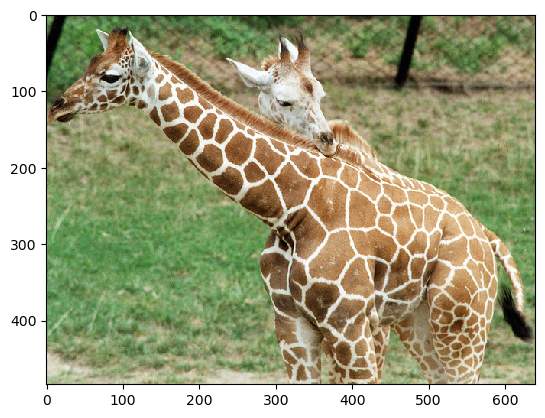

In [9]:
# Trialling image conversion with one giraffe image: 

trial_image_id = giraffe_image_ids_list[0]
print(f"Trial image id: {trial_image_id}\n")

image_info = coco_api.loadImgs(trial_image_id)[0]
print(image_info)

image_path = f"{images_base_path}/{fill_to_twelve(str(trial_image_id))}.jpg"

image = torchvision.datasets.folder.default_loader(image_path)
image_tensor = transform(image)

show_image(trial_image_id)

In [10]:
# Tensor to image transformer: 
transform_to_image = transforms.ToPILImage()

<h1>Preprocessing</h1>
<br>
<h2>Train</h2>

In [11]:
# Adding all giraffe images to a list of tensors: 

giraffe_images1 = []

for image_id in giraffe_image_ids_list:
    image_info = coco_api.loadImgs(image_id)[0]
    image_path = f"{images_base_path}/{fill_to_twelve(str(image_id))}.jpg"
    image = torchvision.datasets.folder.default_loader(image_path)
    image_tensor = transform(image)
    giraffe_images1.append(image_tensor)

print(f"Giraffe_images length: {len(giraffe_images1)}")

Giraffe_images length: 2546


In [12]:
# Calculating the mean and standard deviation values for normalisation: 

# Stacking the list of tensors into a single tensor: 
giraffe_images_stack = torch.stack(giraffe_images1)

mean = torch.mean(giraffe_images_stack, dim=(0, 2, 3))
std = torch.std(giraffe_images_stack, dim=(0, 2, 3))

print("Mean for each channel:", mean)
print("Standard deviation for each channel:", std)

# These should be: 
# Mean for each channel: tensor([0.4791, 0.4719, 0.3978])
# Standard deviation for each channel: tensor([0.2466, 0.2431, 0.2626])
# WARNING: Be careful these mean and std values are actually as above and not 0 and 1, as there was a bit of 
# ...debugging here. 

Mean for each channel: tensor([0.4791, 0.4719, 0.3978])
Standard deviation for each channel: tensor([0.2466, 0.2431, 0.2626])


In [13]:
# Redefining the transform pipeline with normalisation: 
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# transforms.Normalize also standardizes the data. 

train_images = []

for image_id in giraffe_image_ids_list:
    image_info = coco_api.loadImgs(image_id)[0]
    image_path = f"{images_base_path}/{fill_to_twelve(str(image_id))}.jpg"
    image = torchvision.datasets.folder.default_loader(image_path)
    image_tensor = transform(image)
    train_images.append(image_tensor)

print(f"Giraffe_images length: {len(train_images)}")

Giraffe_images length: 2546


<h2>Validation</h2>

In [14]:
# Adding all giraffe images in validation set to a list of tensors: 

transform_val = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

giraffe_images_val = []

for image_id in giraffe_image_ids_list_val:
    image_info = coco_api_val.loadImgs(image_id)[0]
    image_path = f"{val_images_base_path}/{fill_to_twelve(str(image_id))}.jpg"
    image = torchvision.datasets.folder.default_loader(image_path)
    image_tensor = transform_val(image)
    giraffe_images_val.append(image_tensor)

print(f"Giraffe_images_val length: {len(giraffe_images_val)}")

Giraffe_images_val length: 101


In [15]:
# Calculating the mean and standard deviation values for normalisation, for the validation set: 

# Stacking the list of tensors into a single tensor: 
giraffe_images_stack_val = torch.stack(giraffe_images_val)

mean = torch.mean(giraffe_images_stack_val, dim=(0, 2, 3))
std = torch.std(giraffe_images_stack_val, dim=(0, 2, 3))

print("Mean for each channel, validation:", mean)
print("Standard deviation for each channel, validation:", std)

# These should be: 
# Mean for each channel, validation: tensor([0.4786, 0.4694, 0.3994])
# Standard deviation for each channel, validation: tensor([0.2495, 0.2424, 0.2610])

Mean for each channel, validation: tensor([0.4786, 0.4694, 0.3994])
Standard deviation for each channel, validation: tensor([0.2495, 0.2424, 0.2610])


In [16]:
val_images = []

for image_id in giraffe_image_ids_list_val:
    image_info = coco_api_val.loadImgs(image_id)[0]
    image_path = f"{val_images_base_path}/{fill_to_twelve(str(image_id))}.jpg"
    image = torchvision.datasets.folder.default_loader(image_path)
    image_tensor = transform(image)
    val_images.append(image_tensor)

print(f"Giraffe_images length: {len(val_images)}")

Giraffe_images length: 101


<h2>Dataset and Dataloader</h2>

In [ ]:
batch_size = 2

class GiraffeDataset(Dataset):
    def __init__(self, images, targets, transforms):
        self.images = images
        self.targets = targets
        self.transforms = transforms
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        #image.show() can then be used after it's converted back from a tensor. 
        image = transform_to_image(self.images[index])
        target = self.targets[index]
        return image, target

    

train_dataset = GiraffeDataset(train_images, train_targets)
val_dataset = GiraffeDataset(val_images, val_targets)

# QUESTION: Drop_last avoids errors if there are different size tensors I think:
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
# val_dataloader = DataLoader(val_dataset.images, batch_size=batch_size, shuffle=False, drop_last=True)

<h2>Training targets</h2>

In [18]:
train_targets = []
for image_id in giraffe_image_ids_list:
    ann_ids = coco_api.getAnnIds(imgIds=image_id)
    annotation = coco_api.loadAnns(ann_ids)
    # Reformatting annotations to fit PyTorch documentation: 
    # https://pytorch.org/vision/main/models/generated/torchvision.models.detection.maskrcnn_resnet50_fpn.html
    boxes = []
    for i in range(len(annotation)):
        boxes.append(annotation[i]['bbox'])
    boxes = torch.tensor(boxes, dtype=torch.float32)
    
    labels = []
    for i in range(len(annotation)):
        labels.append(annotation[i]['category_id'])
    labels = torch.tensor(labels, dtype=torch.int64) # N
    
    image_id = []
    for i in range(len(annotation)):
        image_id.append(annotation[i]['image_id'])
    image_id = torch.tensor(image_id, dtype=torch.int64) # 1
    
    area = []
    for i in range(len(annotation)):
        area.append(annotation[i]['area'])
    area = torch.tensor(area, dtype=torch.int64) # Generic tensor
    
    iscrowd = []
    for i in range(len(annotation)):
        iscrowd.append(annotation[i]['iscrowd'])
    iscrowd = torch.tensor(iscrowd, dtype=torch.uint8) 
    
    masks = []
    for i in range(len(annotation)):
        masks.append(annotation[i]['segmentation'])
    masks = torch.tensor(masks, dtype=torch.uint8)
    
    
    


/var/folders/7p/tr5vw9l1527fffw3rncgyv040000gn/T/ipykernel_770/1967084409.py:25: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  area = torch.tensor(area, dtype=torch.int64) # Generic tensor
/var/folders/7p/tr5vw9l1527fffw3rncgyv040000gn/T/ipykernel_770/1967084409.py:35: DeprecationWarning: an integer is required (got type float).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  masks = torch.tensor(masks, dtype=torch.uint8)


ValueError: expected sequence of length 80 at dim 2 (got 62)

In [73]:
train_targets

[[{'segmentation': [[318.68,
     478.56,
     300.19,
     387.2,
     276.26,
     321.94,
     283.87,
     268.65,
     229.49,
     228.4,
     164.23,
     167.5,
     113.11,
     116.38,
     81.57,
     127.25,
     40.24,
     128.34,
     25.02,
     142.48,
     3.26,
     139.22,
     4.35,
     123.99,
     47.86,
     78.31,
     59.82,
     54.38,
     76.13,
     44.59,
     67.43,
     17.4,
     87.01,
     17.4,
     107.68,
     18.49,
     134.87,
     44.59,
     189.25,
     70.7,
     271.91,
     131.6,
     341.52,
     160.97,
     361.1,
     184.9,
     375.24,
     187.07,
     382.85,
     178.37,
     387.2,
     169.67,
     430.71,
     180.55,
     444.84,
     200.13,
     500.31,
     224.05,
     569.92,
     271.91,
     597.11,
     292.58,
     631.92,
     354.57,
     639.53,
     412.22,
     633.01,
     432.88,
     614.52,
     426.36,
     590.59,
     375.24,
     567.75,
     476.39,
     500.31,
     476.39,
     449.2,
     410.04,
 

<h2>Dataset and Dataloader</h2>

In [80]:
batch_size = 2


class GiraffeDataset(Dataset):
    def __init__(self, images, targets):
        self.images = images
        self.targets = targets
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        #image.show() can then be used after it's converted back from a tensor. 
        image = transform_to_image(self.images[index])
        target = self.targets[index]
        return image, target

    

train_dataset = GiraffeDataset(train_images, train_targets)
val_dataset = GiraffeDataset(val_images, val_targets)

# QUESTION: Drop_last avoids errors if there are different size tensors I think:
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
# val_dataloader = DataLoader(val_dataset.images, batch_size=batch_size, shuffle=False, drop_last=True)

In [81]:
train_dataloader

<h2>Model</h2>

In [82]:
num_classes = 2 # Object and not-object

# Defining the MaskRCNNPredictor class to adjust number of classes to 2. 
class MaskRCNNPredictor(nn.Module):
    def __init__(self, in_channels, hidden_layer, num_classes):
        super(MaskRCNNPredictor, self).__init__()
        self.conv = nn.Conv2d(in_channels, 256, kernel_size=3, stride=1, padding=1)
        self.bn = nn.BatchNorm2d(256)
        self.relu = nn.ReLU(inplace=True)
        self.mask_predictor = nn.Conv2d(256, num_classes, kernel_size=1, stride=1, padding=0)
    
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.mask_predictor(x)
        return x

# Instantiating model: 
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# Modifying number of output channels in the roi_heads layer:
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = nn.Linear(in_features, num_classes)

# Modifying number of output channels in the mask_roi_pool layer:
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                   hidden_layer,
                                                   num_classes)

/Users/tom/opt/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/tom/opt/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<h2>Training</h2>

In [66]:
image_list = []
target_list = []
for target, image in enumerate(train_dataloader):
    image_list.append(image)
    target_list.append(target)

In [84]:
train_dataset.targets

[[{'segmentation': [[318.68,
     478.56,
     300.19,
     387.2,
     276.26,
     321.94,
     283.87,
     268.65,
     229.49,
     228.4,
     164.23,
     167.5,
     113.11,
     116.38,
     81.57,
     127.25,
     40.24,
     128.34,
     25.02,
     142.48,
     3.26,
     139.22,
     4.35,
     123.99,
     47.86,
     78.31,
     59.82,
     54.38,
     76.13,
     44.59,
     67.43,
     17.4,
     87.01,
     17.4,
     107.68,
     18.49,
     134.87,
     44.59,
     189.25,
     70.7,
     271.91,
     131.6,
     341.52,
     160.97,
     361.1,
     184.9,
     375.24,
     187.07,
     382.85,
     178.37,
     387.2,
     169.67,
     430.71,
     180.55,
     444.84,
     200.13,
     500.31,
     224.05,
     569.92,
     271.91,
     597.11,
     292.58,
     631.92,
     354.57,
     639.53,
     412.22,
     633.01,
     432.88,
     614.52,
     426.36,
     590.59,
     375.24,
     567.75,
     476.39,
     500.31,
     476.39,
     449.2,
     410.04,
 

In [1]:
num_epochs = 10

# for epoch in range(num_epochs):
